# OCR project
AIFFEL 대전 탐색 노드 18

프로세스는 다음과 같다. (노드의 제시된 순서)
1. 검증용 데이터셋 준비
2. 테스트 진행 (모델)
3. 테스트 결과 정리
4. 결과 분석과 결론 제시

## 1. 검증용 데이터셋 준비

ch.jpg


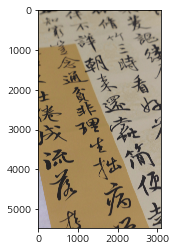

book.jpg


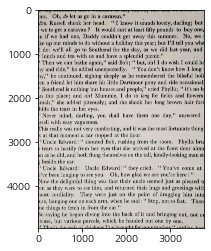

style.jpg


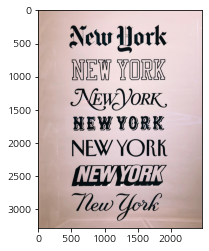

ko_mul_sign.jpg


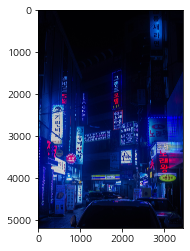

coding.jpg


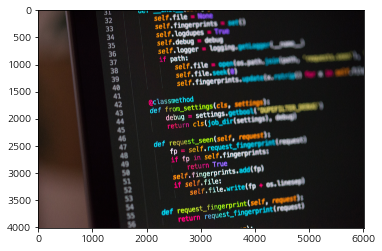

ko_neo.jpg


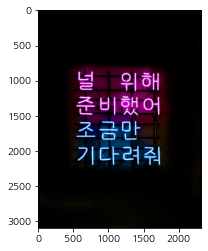

fo.jpg


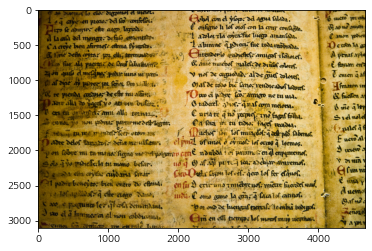

ko_sign.jpg


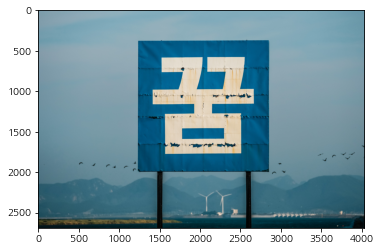

hi.jpg


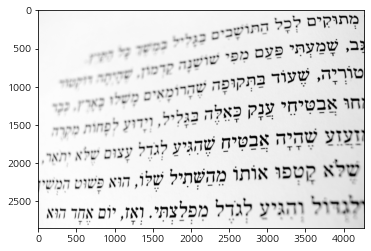

In [29]:
import cv2
import os
import matplotlib.pyplot as plt
path = os.getenv('HOME')+'/aiffel/ocr_python/data/'

def search(dirname):
    filenames = os.listdir(dirname)
    f_list = []
    for filename in filenames:
        full_filename = os.path.join(dirname, filename)
        f_list.append(full_filename)
        print (filename)
        img = cv2.imread(full_filename, cv2.IMREAD_COLOR)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.show()
    return f_list
f_list = search(path)
# for p_img in f_list:
#     img = cv2.imread(p_img, cv2.IMREAD_COLOR)
#     plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
#     plt.show()

## 2. 테스트 진행 (모델)

### Google API

In [41]:
def detect_text(path):
    """Detects text in the file."""
    from google.cloud import vision
    import io
    client = vision.ImageAnnotatorClient()

    with io.open(path, 'rb') as image_file:
        content = image_file.read()
        
    image = vision.Image(content=content)

    response = client.text_detection(image=image)
    texts = response.text_annotations
    print('Texts:')

    print('\n"{}"'.format(texts[0].description))

#     for text in texts:
#         print('\n"{}"'.format(text.description))

    vertices = (['({},{})'.format(vertex.x, vertex.y)
                 for vertex in texts[0].bounding_poly.vertices])

    print('bounds: {}'.format(','.join(vertices)))

    if response.error.message:
        raise Exception(
            '{}\nFor more info on error messages, check: '
            'https://cloud.google.com/apis/design/errors'.format(
                response.error.message))

In [43]:
import os
os.environ["GOOGLE_APPLICATION_CREDENTIALS"] =  os.getenv('HOME')+'/aiffel/ocr_python/my_google_api_key.json'

for p_img in f_list:
    detect_text(p_img)

Texts:

"家不情場
大ケ
認
朝
(美
杜情
病
"
bounds: (1,106),(3030,106),(3030,5169),(1,5169)
Texts:

"oms. Oh, do let us go in a caravan."
Mrs. Russell shook her head. "I know it sounds lovely, darling; but
e we to get a caravan ? It would cost at least fifty pounds to buy one,
en if we had one, Daddy couldn't get away this summer. No, we
ake up our minds to do without a holiday this year; but I'll tell you wha
11 do: we'll all go to Southend for the day, as we did last year, and
r lunch and tea with us and have a splendid picnic."
Then we can bathe again," said Bob; " but, oh! I do wish I could ha
ny and ride," he added unexpectedly.
ny," he continued, sighing deeply as he remembered the blissful holi
en a friend let him share his little Dartmoor pony and ride occasional
"Southend is nothing but houses and people," cried Phyllis; “ it's no b
an this place; and oh! Mummie, I do so long for fields and flowers
imals," she added piteously; and she shook her long brown hair forv
hide the tears in her ey

### Keras-ocr

In [12]:
import keras_ocr
# keras-ocr이 detector과 recognizer를 위한 모델을 자동으로 다운로드받게 됩니다. 
pipeline = keras_ocr.pipeline.Pipeline()

Looking for /home/aiffel-dj28/.keras-ocr/craft_mlt_25k.h5
Instructions for updating:
Create a `tf.sparse.SparseTensor` and use `tf.sparse.to_dense` instead.
Looking for /home/aiffel-dj28/.keras-ocr/crnn_kurapan.h5


In [13]:
# 테스트에 사용할 이미지 url을 모아 봅니다. 추가로 더 모아볼 수도 있습니다. 
image_urls = [
    #'https://source.unsplash.com/M7mu6jXlcns/640x460',
    #'https://source.unsplash.com/6jsp4iHc8hI/640x460',
    #'https://source.unsplash.com/98uYQ-KupiE',
    #'https://source.unsplash.com/j9JoYpaJH3A',
    #'https://source.unsplash.com/eBkEJ9cH5b4',  
    'https://images.unsplash.com/photo-1528459199957-0ff28496a7f6?ixid=MXwxMjA3fDB8MHxzZWFyY2h8MTR8fGxldHRlcnxlbnwwfHwwfA%3D%3D&ixlib=rb-1.2.1&auto=format&fit=crop&w=500&q=60',
    'https://images.unsplash.com/photo-1467688695332-6b486449d78f?ixlib=rb-1.2.1&ixid=MXwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHw%3D&auto=format&fit=crop&w=1353&q=80',
    'https://images.unsplash.com/photo-1546187179-26df4c5497a7?ixid=MXwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHw%3D&ixlib=rb-1.2.1&auto=format&fit=crop&w=1350&q=80',
    'https://images.unsplash.com/photo-1543281667-ae70d8a00b90?ixid=MXwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHw%3D&ixlib=rb-1.2.1&auto=format&fit=crop&w=564&q=80',
    'https://images.unsplash.com/photo-1515879218367-8466d910aaa4?ixid=MXwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHw%3D&ixlib=rb-1.2.1&auto=format&fit=crop&w=1350&q=80',
    'https://images.unsplash.com/photo-1534210199251-0ef13538e0a4?ixid=MXwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHw%3D&ixlib=rb-1.2.1&auto=format&fit=crop&w=1350&q=80',
    'https://images.unsplash.com/photo-1554296759-ec7c058ecf9c?ixlib=rb-1.2.1&ixid=MXwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHw%3D&auto=format&fit=crop&w=676&q=80',
    'https://images.unsplash.com/photo-1531931477284-7e16215c9540?ixlib=rb-1.2.1&ixid=MXwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHw%3D&auto=format&fit=crop&w=634&q=80',
    'https://images.unsplash.com/photo-1522896696058-236b2f7fb361?ixid=MXwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHw%3D&ixlib=rb-1.2.1&auto=format&fit=crop&w=677&q=80',
]

images = [ keras_ocr.tools.read(url) for url in image_urls]
prediction_groups = [pipeline.recognize([url]) for url in image_urls]

/home/aiffel-dj28/anaconda3/envs/aiffel/lib/python3.7/site-packages/keras_ocr/tools.py:166: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  horizontalalignment='right' if side == 'left' else 'left')


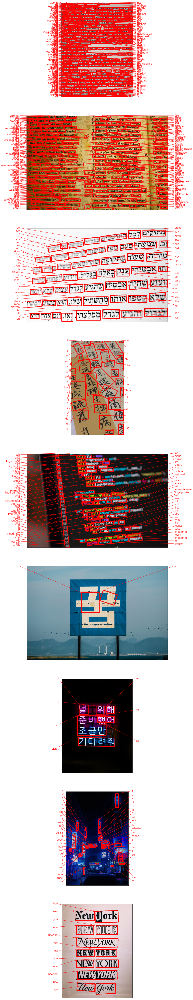

In [14]:
# Plot the predictions
fig, axs = plt.subplots(nrows=len(images), figsize=(100, 100))
for idx, ax in enumerate(axs):
    keras_ocr.tools.drawAnnotations(image=images[idx], 
                                    predictions=prediction_groups[idx][0], ax=ax)

### pytesseract

In [35]:
import os
import pytesseract
from PIL import Image
from pytesseract import Output
import matplotlib.pyplot as plt

# OCR Engine modes(–oem):
# 0 - Legacy engine only.
# 1 - Neural nets LSTM engine only.
# 2 - Legacy + LSTM engines.
# 3 - Default, based on what is available.

# Page segmentation modes(–psm):
# 0 - Orientation and script detection (OSD) only.
# 1 - Automatic page segmentation with OSD.
# 2 - Automatic page segmentation, but no OSD, or OCR.
# 3 - Fully automatic page segmentation, but no OSD. (Default)
# 4 - Assume a single column of text of variable sizes.
# 5 - Assume a single uniform block of vertically aligned text.
# 6 - Assume a single uniform block of text.
# 7 - Treat the image as a single text line.
# 8 - Treat the image as a single word.
# 9 - Treat the image as a single word in a circle.
# 10 - Treat the image as a single character.
# 11 - Sparse text. Find as much text as possible in no particular order.
# 12 - Sparse text with OSD.
# 13 - Raw line. Treat the image as a single text line, bypassing hacks that are Tesseract-specific.

def crop_word_regions(image_path='./images/sample.png', output_path='./output', lang='eng'):
    if not os.path.exists(output_path):
        os.mkdir(output_path)
    custom_oem_psm_config = r'--oem 3 --psm 3'
    image = Image.open(image_path)

    recognized_data = pytesseract.image_to_data(
        image, lang=lang,    # 한국어라면 lang='kor'
        config=custom_oem_psm_config,
        output_type=Output.DICT
    )
    
    top_level = max(recognized_data['level'])
    index = 0
    cropped_image_path_list = []
    for i in range(len(recognized_data['level'])):
        level = recognized_data['level'][i]
    
        if level == top_level:
            left = recognized_data['left'][i]
            top = recognized_data['top'][i]
            width = recognized_data['width'][i]
            height = recognized_data['height'][i]
            
            output_img_path = os.path.join(output_path, f"{str(index).zfill(4)}.png")
            #print(output_img_path)
            cropped_image = image.crop((
                left,
                top,
                left+width,
                top+height
            ))
            cropped_image.save(output_img_path)
            cropped_image_path_list.append(output_img_path)
            index += 1
    print("cnt: ", index)
    return cropped_image_path_list

def recognize_images(cropped_image_path_list, lang):
    custom_oem_psm_config = r'--oem 3 --psm 7'
    
    for image_path in cropped_image_path_list:
        image = Image.open(image_path)
        recognized_data = pytesseract.image_to_string(
            image, lang=lang,    # 한국어라면 lang='kor'
            config=custom_oem_psm_config,
            output_type=Output.DICT
        )
        print(recognized_data, end = ' ')
        #print(recognized_data['text'], end = " ")
    print("Done")

work_dir = path
# img_file_path = work_dir + '/ko_neo.jpg'   #테스트용 이미지 경로입니다. 본인이 선택한 파일명으로 바꿔주세요. 

# cropped_image_path_list = crop_word_regions(img_file_path, work_dir)
# # 위에서 준비한 문자 영역 파일들을 인식하여 얻어진 텍스트를 출력합니다.
# recognize_images(cropped_image_path_list)
i = 0
for p_img in f_list:
    print(p_img[41:])
    if 'ko' in p_img:
        cropped_image_path_list = crop_word_regions(p_img, work_dir + '/' + str(i), 'kor')
        # 위에서 준비한 문자 영역 파일들을 인식하여 얻어진 텍스트를 출력합니다.
        recognize_images(cropped_image_path_list, 'kor')
    else:
        cropped_image_path_list = crop_word_regions(p_img, work_dir + '/' + str(i), 'eng')
        # 위에서 준비한 문자 영역 파일들을 인식하여 얻어진 텍스트를 출력합니다.
        recognize_images(cropped_image_path_list, 'eng')    
    i = i+1

ch.jpg
cnt:  1
{'text': '\x0c'} Done
book.jpg
cnt:  424


{'text': 'ay\n\x0c'} {'text': 'Ally\n\x0c'} {'text': 'AYA.\n\x0c'} {'text': 'CAASBASLAAALYY\n\x0c'} {'text': '9 Sirs\n\x0c'} {'text': 'VY Ve\n\x0c'} {'text': 'tAAVLA SS\n\x0c'} {'text': 'S&S BJ\n\x0c'} {'text': 'tig\n\x0c'} {'text': 'A CAAL\n\x0c'} {'text': 'Vv eey\n\x0c'} {'text': 'AGCAAL WY\n\x0c'} {'text': 'CAALLA\n\x0c'} {'text': 'vv was\n\x0c'} {'text': 'AY LAS YASS OW\n\x0c'} {'text': 'MNS.\n\x0c'} {'text': 'Oh,\n\x0c'} {'text': 'do\n\x0c'} {'text': 'let\n\x0c'} {'text': 'Us\n\x0c'} {'text': '48\n\x0c'} {'text': 'in\n\x0c'} {'text': 'a\n\x0c'} {'text': 'caravan.’\n\x0c'} {'text': 'Mrs.\n\x0c'} {'text': 'Russell\n\x0c'} {'text': 'shook\n\x0c'} {'text': 'her\n\x0c'} {'text': 'head.\n\x0c'} {'text': '— es\n\x0c'} {'text': 'kno\n\x0c'} {'text': 'w it\n\x0c'} {'text': 'sounds\n\x0c'} {'text': 'lovely,\n\x0c'} {'text': 'darling;\n\x0c'} {'text': 'but\n\x0c'} {'text': '_\n\x0c'} {'text': 'we\n\x0c'} {'text': 'to\n\x0c'} {'text': 'get\n\x0c'} {'text': 'a\n\x0c'} {'text': 'caravan ?\n\x0c

{'text': 'him\n\x0c'} {'text': 'into\n\x0c'} {'text': 'USEC,\n\x0c'} {'text': 'hanging\n\x0c'} {'text': 'One\n\x0c'} {'text': 'OT)\n\x0c'} {'text': 'each\n\x0c'} {'text': 'ATHY,\n\x0c'} {'text': 'whe\n\x0c'} {'text': 'nh\n\x0c'} {'text': 'e said\n\x0c'} {'text': 'es\n\x0c'} {'text': 'Stop,\n\x0c'} {'text': 'not\n\x0c'} {'text': 'SO\n\x0c'} {'text': 'fast.\n\x0c'} {'text': 'Ther\n\x0c'} {'text': 'me\n\x0c'} {'text': 'things\n\x0c'} {'text': 'tO\n\x0c'} {'text': 'fetch\n\x0c'} {'text': 'in\n\x0c'} {'text': 'from\n\x0c'} {'text': 'th\n\x0c'} {'text': 'e car.”’\n\x0c'} {'text': 'So\n\x0c'} {'text': 'saying\n\x0c'} {'text': 'he\n\x0c'} {'text': 'began\n\x0c'} {'text': 'diving\n\x0c'} {'text': 'into\n\x0c'} {'text': 'the\n\x0c'} {'text': 'back\n\x0c'} {'text': 'ot\n\x0c'} {'text': 'it\n\x0c'} {'text': 'and\n\x0c'} {'text': 'bringing\n\x0c'} {'text': 'out,\n\x0c'} {'text': 'not\n\x0c'} {'text': 'Ol\n\x0c'} {'text': 'itcase,\n\x0c'} {'text': 'but\n\x0c'} {'text': 'various\n\x0c'} {'text': 'par

## 3. 테스트 결과 정리
위에 결과를 간략히 살펴보면 google API를 제외한 나머지 모델은 영어만 인식을 잘 할 수 있다는 것을 알 수 있다.   
따라서 영어에 대해서 비교하는 시각화와 google API가 다른 언어에서 성능을 보기 쉽도록 하겠다.

style.jpg


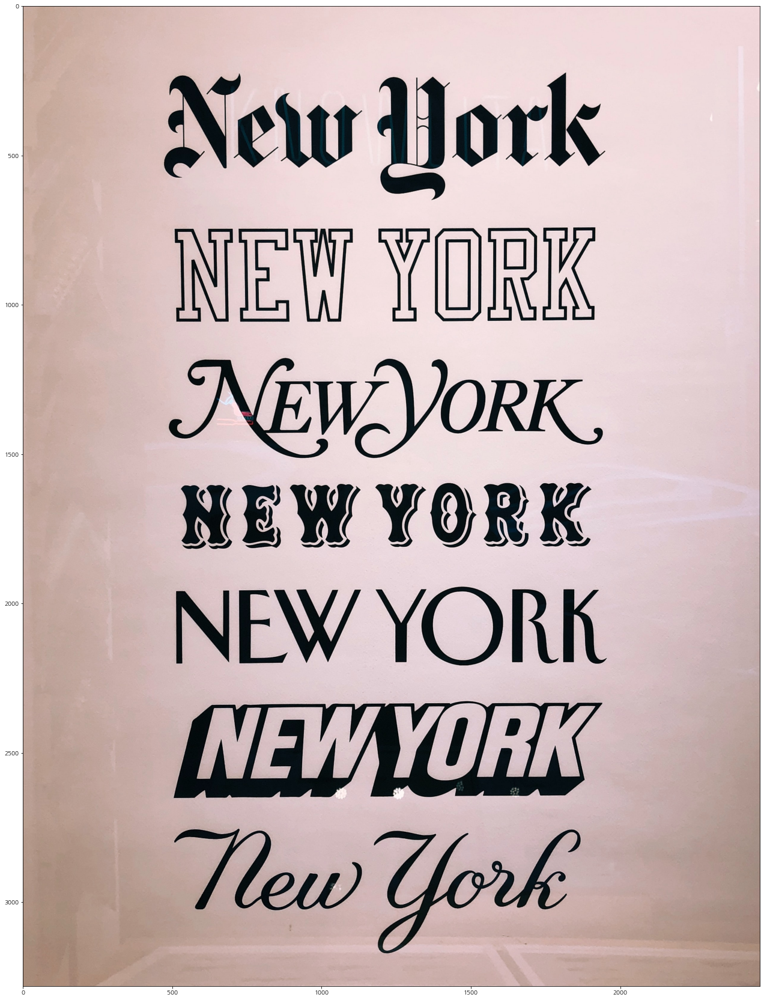

google API
Texts:

"New York
NEW YORK
NEWYORK.
HEW YORK
NEW YORK
NEW YORK
Tew York
"
bounds: (469,212),(1951,212),(1951,3154),(469,3154)
-----
keras-ocr


/home/aiffel-dj28/anaconda3/envs/aiffel/lib/python3.7/site-packages/keras_ocr/tools.py:166: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  horizontalalignment='right' if side == 'left' else 'left')


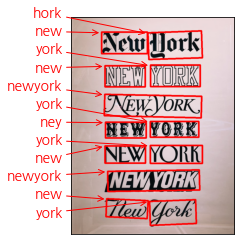

-----
pytesseract
cnt:  1
{'text': '= -\n\x0c'} Done
-----
#####
coding.jpg


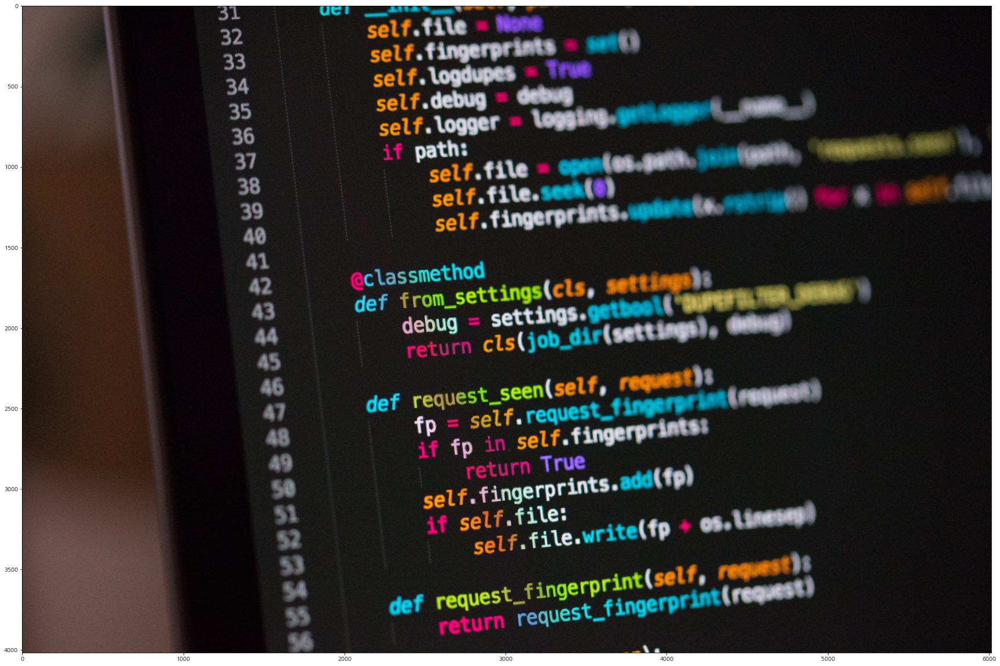

google API
Texts:

"31
self.file None
self.fingerprints set
self.Logdupes True
self.debug = debug
self.Logger log
if path:
self.file open(os.path. joir(go,
self.file.seek(0)
self.fingerprints.g
32
33
34
35
36
ging.geo .
37
38
39
40
41
@classmethod
42
43
def from_settings(cls, settingss
debug = settings.getbool(urEL78.0
return cls(job_dir(settinge
44
45
46
47
48
49
50
51
52
def request_seen(self, request)s
fp = self.request_fingerprinttreguest
if fp in self.fingerprints:
return True
self.fingerprints.add(fp)
if self.file:
self.file.write(fp + os.Linesep)
54
55
56
def request_fingerprint(self, request)s
return request_fingerprint(request)
"
bounds: (1216,0),(5027,0),(5027,4017),(1216,4017)
-----
keras-ocr


/home/aiffel-dj28/anaconda3/envs/aiffel/lib/python3.7/site-packages/keras_ocr/tools.py:166: MatplotlibDeprecationWarning: The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  horizontalalignment='right' if side == 'left' else 'left')


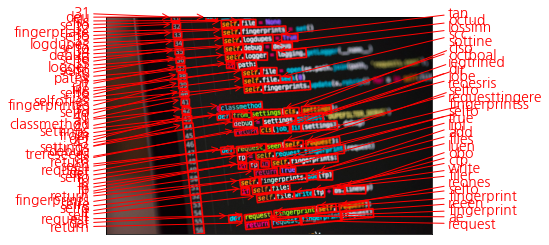

-----
pytesseract
cnt:  3
{'text': '\x0c'} {'text': '\x0c'} {'text': '=\n\x0c'} Done
-----


In [52]:
for p_img in f_list:
    if 'style' in p_img:
        print(p_img[41:])
        img = cv2.imread(p_img, cv2.IMREAD_COLOR)
        plt.figure(figsize=(30,30))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.show()
        
        #google API
        print('google API')
        detect_text(p_img)
        print('-----')
        
        #keras
        print('keras-ocr')
        keras_ocr.tools.drawAnnotations(image=images[8], 
                                    predictions=prediction_groups[8][0])
        plt.show()
        print('-----')
        
        #pytesseract
        print('pytesseract')
        i = 10
        cropped_image_path_list = crop_word_regions(p_img, work_dir + '/' + str(i), 'eng')
        recognize_images(cropped_image_path_list, 'eng')
        print('-----')

print('#####')        
for p_img in f_list:
    if 'coding' in p_img:
        print(p_img[41:])
        img = cv2.imread(p_img, cv2.IMREAD_COLOR)
        
        plt.figure(figsize=(30,30))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.show()
        
        #google API
        print('google API')
        detect_text(p_img)
        print('-----')
        
        #keras
        print('keras-ocr')
        keras_ocr.tools.drawAnnotations(image=images[4], 
                                    predictions=prediction_groups[4][0])
        plt.show()
        print('-----')
        
        #pytesseract
        print('pytesseract')
        i = 10
        cropped_image_path_list = crop_word_regions(p_img, work_dir + '/' + str(i), 'eng')
        recognize_images(cropped_image_path_list, 'eng')
        print('-----')

ch.jpg


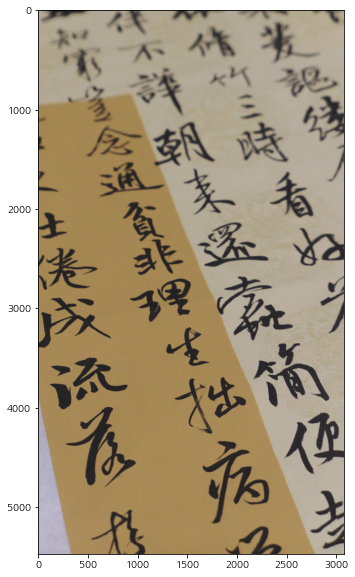

Texts:

"家不情場
大ケ
認
朝
(美
杜情
病
"
bounds: (1,106),(3030,106),(3030,5169),(1,5169)
-----
book.jpg


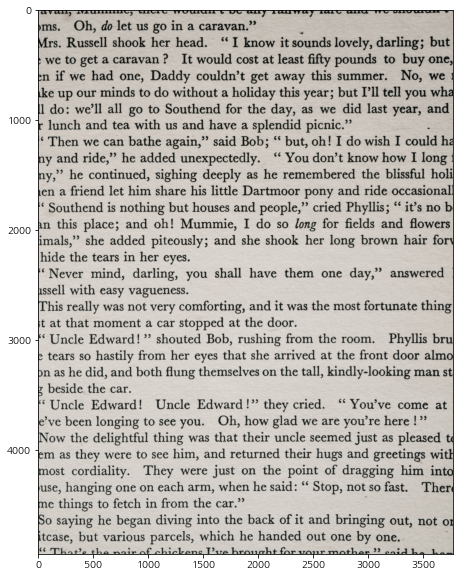

Texts:

"oms. Oh, do let us go in a caravan."
Mrs. Russell shook her head. "I know it sounds lovely, darling; but
e we to get a caravan ? It would cost at least fifty pounds to buy one,
en if we had one, Daddy couldn't get away this summer. No, we
ake up our minds to do without a holiday this year; but I'll tell you wha
11 do: we'll all go to Southend for the day, as we did last year, and
r lunch and tea with us and have a splendid picnic."
Then we can bathe again," said Bob; " but, oh! I do wish I could ha
ny and ride," he added unexpectedly.
ny," he continued, sighing deeply as he remembered the blissful holi
en a friend let him share his little Dartmoor pony and ride occasional
"Southend is nothing but houses and people," cried Phyllis; “ it's no b
an this place; and oh! Mummie, I do so long for fields and flowers
imals," she added piteously; and she shook her long brown hair forv
hide the tears in her eyes.
"Never mind, darling, you shall have them one day," answered
ussell with ea

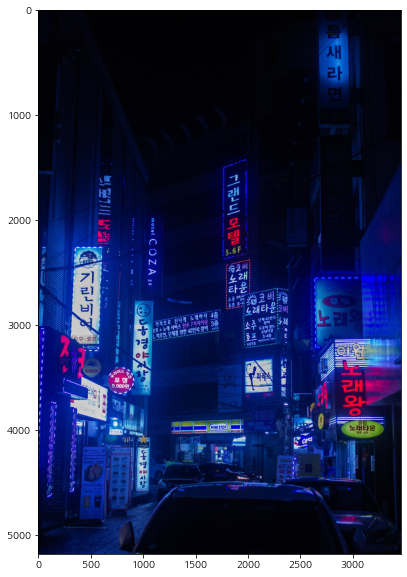

Texts:

"HIN
KIRIN
5.6 F
71
린
1
타운
코프 3:4 1코 비
노래타운:2비
公子
호프
단체 40**
완벽
Husic
신촌점
**
노리드
가격으로 신나게 노래하자 4층
초프 + 노래 서비스 안주 7가지이상
4, 피로연, 단체를 위한 40인석 완비
3층
단체40인석
완비
도우미 찾는
손님사절
I3:45
2주·호프
3-92821
영업시간:오후 4시 오전 10
: 유흥주점
1.392-6565
KIRIN
창
2F
포장
9,000원 안주 입께
京夜市場
ROOM KARAOKE
BY
Room Club i&e Karacke
B1
와
ALT
왕
Kooin
L래타운
새로운 모습으로
꽃아 찜겠습니다
Cozy stay
COZA
MINISTOP
클럽
노래타운
ARE
DDイ
0KA
맥주 소주
SAPPORO
기린비어
ATM ATA
Cass
IlNG o R inRIL
ADT
후라이드 치킨!!
Meicene loH
AIRBANUNE
WI0.000 ( 19.000 )
HA
름 새라 면
Ipanema Grill
motel CO ZA 2 F
"
bounds: (337,175),(3211,175),(3211,4612),(337,4612)
-----
ko_neo.jpg


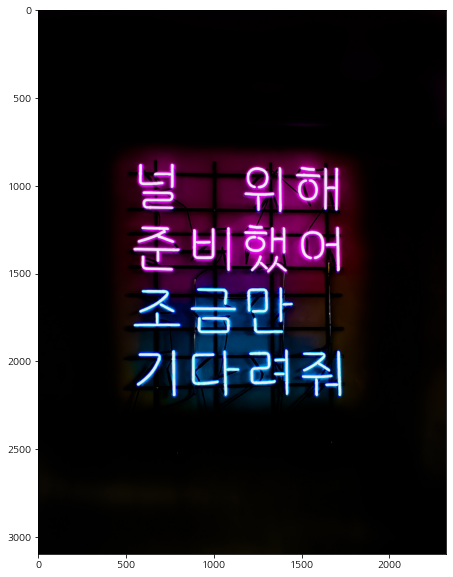

Texts:

"널 위해
준비했어
조금만
기다려줘
"
bounds: (540,881),(1720,881),(1720,2207),(540,2207)
-----
fo.jpg


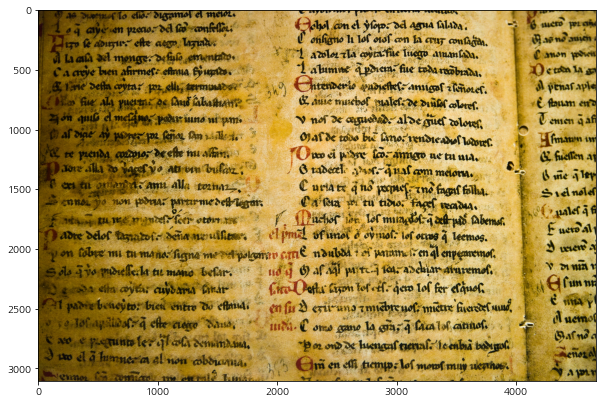

Texts:

"44 em to elio digamof el meroz.
hl con el ylop. del agua alada.
Coifano li lof onof on la auT confaga.
awlon la coyra file Tucgo amamlda.
1abumms apdren. fue toda rnõbrada,
a Chtenderio pudiefteſs anigaf alenoref.
mero pera
4 aive en pzcaodl foonkellori
as no auen
170
M la ata del monge. defulo ementao.
Ca arye ben afirmess efmua Fupts.
1ne defta coyta: pr elli termunabo
fie ala puertni de lîud fabatant
in qub d melano psr iuns ni pm.
af diae
Canon poowis
Deton La g
l penaf aple
E faum end
auie muchof malef. de diukf olbref.
V nof de agusd, alde guef doloes,
garde too b inorendica
Oo ci pire fo-amgo ne tu uia.
8 radecel. N.qual am maoru.
V enen gafi
Ay n o feno fan 1A
re prenda czmo, de che mi aan,
Jore alla 2o Acfvo an un bufax;
fmawn im
& fuctlen ap
quaf am målora.
C uria te d no poquef. zno faaf Eilha.
Cafia tu tidio. fael eada.
Bme lep
an tn oand Am alla tona.
Sidnolef
enno yo non aA. partarmedet-Tegar
e mm ler otorn
adre delof taatoir deña nwulfie.
360
palef a f
Euerd al


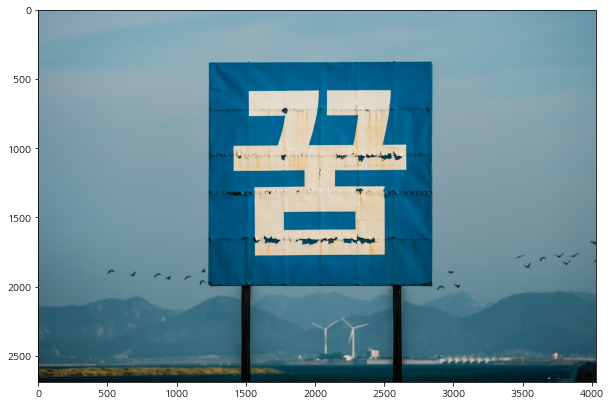

Texts:

"꿈
"
bounds: (1398,561),(2679,561),(2679,1811),(1398,1811)
-----
hi.jpg


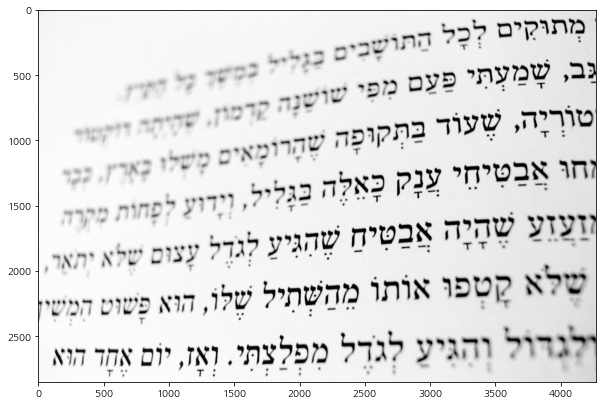

Texts:

"הרתוש בם
םמש ל דידז
מ ה ל תושבי םגליל כלש ל דירז
72
ב ע ע א הי שושנה קד מון, שדיחה דוקטול
ו ו ת שואיס ארץי
וא בט ענק לה בגליל , וידוע לפח מקרה
זעז היב בט א ש
O'NE
להו
ות
T.
T:
TT
לש אע שמה משיו
טפא
ילגר הא גד לצא ה ו ה כוא
שוט
7.
T
T :
"
bounds: (1,0),(4260,0),(4260,2818),(1,2818)
-----


In [54]:
for p_img in f_list:
    if 'style' not in p_img and 'coding' not in p_img:
        print(p_img[41:])
        img = cv2.imread(p_img, cv2.IMREAD_COLOR)
        
        plt.figure(figsize=(10,10))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.show()
        
        #google API
        detect_text(p_img)
        print('-----')
        

## 4. 결과 분석과 결론 제시

위에 결과를 보면 알겠지만 google API가 다른 모델보다 성능이 뛰어나다.   
Google API는 영어뿐만 아니라 한국어, 한자, 히브리어(?) 등을 지원하는 것을 볼 수 있다. 다만 중간에 노랑책은 정확히 어떤 언어인지는 모르겠지만 영어는 아닌 것 같은데 google API는 영어로 인식한 것 같다.(한계점을 보여준다.)   
또한 google API는 글씨 크기가 커도('꿈' 이라는 단어) 인식 가능하며, 스타일이 달라도('New York'), 세로 쓰기이던 가로쓰기이던('한국 간판') 아주 잘 인식하는 것을 확인할 수 있다. (심지어 코딩 스타일까지)   

그에 비하여 pytesseract는 한국어 기능이 있음에도 한국어를 잘 인식하지 못하는 것을 알 수 있고, 코딩스타일이나 여러 가지 스타일('New York')에 대하여 아에 글씨 인식을 하지 못하는 것을 볼 수 있다. 아마 책 같이 정형화된 데이터에 대해서 인식을 할 수 있는 것 같다.(물론 다른 옵션이 존재하지만 여기서는 다루지 않겠다.)   

keras-ocr은 영어에 대해서만 인식할 수 있었고, google API보다는 성능이 안 좋지만 pytesseract보다는 좋을 것을 확인할 수 있다.

### 결론

위에 분석 결과로 상업적으로 이용하기 위해서는 google API를 사용하는 것이 좋고, 대부분의 경우에 대해서 좋은 성능을 보여주기 때문에 광학문자를 인식하고 문자화 해주는 모든 서비스에 적용할 수 있을 것 같다.   
내가 개인적으로 구현 해보면 좋을 것 같은 서비스는 책에서 문자들을 인식하여 오디오로 변환해주는 것이다. google API를 이용하면 가능할 것 같다.(책 이미지를 글자로 변환해주는 것을 성공적으로 한 것을 확인하였다.)

## 회고 및 루브릭 평가

### 루브릭 평가 항목
1. OCR을 활용하여 구현하려는 서비스의 기획이 타당한가?(목표로 하는 서비스가 OCR를 적용 가능하며, OCR을 활용했을 때 더욱 유용해진다.)
2. 모델 평가기준이 명확하고 체계적으로 세워졌는가?(평가 기준에 부합하는 테스트 데이터의 특징이 무엇인지 명확하게 제시되었다.)
3. 평가기준에 따라 충분한 분량의 테스트가 진행되고 그 결과가 잘 정리되었는가?(최대 20장까지의 테스트 이미지를 사용해 제시된 평가 기준에 따른 테스트 결과가 잘 정리되어 결론이 도출되었다.)

### 평가 항목에 대한 수행
1. 마지막에 OCR을 활용하여 구현하려는 서비스에 대해서 설명을 간단히 하였다.
2. 모델 평가 기준으로 여러 가지 언어 지원, 글씨 크기, 글씨 스타일, 가로, 세로 쓰기 등을 사용하였다.
3. 9개 이미지를 이용하여 충분한 테스트를 진행했고, 결과를 마지막에 정리하였다.

### 회고

노션에 공지된 꼭 포함이 되어야 할 점
- 이번 프로젝트에서 **어려웠던 점,**
- 프로젝트를 진행하면서 **알아낸 점** 혹은 **아직 모호한 점**.
- 루브릭 평가 지표를 맞추기 위해 **시도한 것들**.
- 만약에 루브릭 평가 관련 지표를 **달성 하지 못했을 때, 이유에 관한 추정**.
- **자기 다짐**

---
- **어려웠던 점**    
이미지를 수집하는 일이 가장 어려웠다. 어떤 이미지는 keras에서 url 접근 권한 때문에 문제가 되어서 이미지를 찾는 것이 좀 많이 제한이 되었다. 그리고 google API를 사용하기 위한 인증과정이 좀 많이 까다로웠다.

---
- **알아낸 점**    
OCR 기술들에 대해서 알아볼 수 있었다. 그리고 구글에서 지원하는 API 서비스들에 대해서도 알 수 있었다. 특별히 google API, keras-ocr, pytesseract에 대한 성능들을 비교해 볼 수 있었다.  

- **모호한 점**    
단순히 구현되어 있는 것을 사용한 것이기 때문에 내부에 정확히 어떻게 구현하는 지에 대해서는 모른다.

---
- **시도한 것들**   
9개의 이미지에 대해서 3개의 모델을 실험하였다. 위에서 설명한 대로 하였다.

---
- **우브릭 평가 관련 지표**   
제 예상에는 모두 달성되었다고 생각한다. 그 이유는 위에 있는 **평가 항목에 대한 수행**에 나와있다.  
- **자기 다짐** 및 **나의 생각들**      
이번 노드 역시 따로 모델을 구성하고 훈련하는 일이 없어서 어렵지 않게 할 수 있었다. OCR에 대한 내용인데 결국, 이미지에서 글자를 인식하고 인식한 글자를 문자로 변환해주는 일을 한다. 그래서 글자 영역을 찾아주는 detection과 해당 영역에서 글자를 classification을 해주는 것이라고 생각할 수 있다. OCR 성능을 측정해 본 결과 Google API가 가장 좋은 성능을 보여주었다.(돈을 받고 서비스하는 이유가 있는 것 같다.) Google API에서 여러 언어를 지원해주는 것이 좀 놀라웠다.(노랑 책에서는 영어로 인식했는데 언어를 지원하지 않은 건지 다른 언어로 인식한 건지까지는 모르겠다.)   